In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import plotly.express as  px
%pylab inline
pylab.rcParams['figure.figsize'] = (10, 6)

Populating the interactive namespace from numpy and matplotlib


Exploring our data

In [2]:
athletes_df = pd.read_csv('athlete_events.csv')

count every event and region how much is it on data set  and reading noc_region

In [3]:
count_discipline = athletes_df.Event.value_counts()
print(count_discipline)
NOC_data = pd.read_csv('noc_regions.csv')
count_discipline2 = NOC_data.region.value_counts()
print(count_discipline2)

Football Men's Football                                5733
Ice Hockey Men's Ice Hockey                            4762
Hockey Men's Hockey                                    3958
Water Polo Men's Water Polo                            3358
Basketball Men's Basketball                            3280
                                                       ... 
Archery Men's Target Archery, 50 metres, Individual       2
Sailing Mixed 18 foot                                     2
Croquet Mixed Doubles                                     2
Archery Men's Championnat Du Monde                        2
Aeronautics Mixed Aeronautics                             1
Name: Event, Length: 765, dtype: int64
Germany           4
Czech Republic    3
Malaysia          3
Russia            3
Yemen             3
                 ..
Lithuania         1
Sweden            1
Egypt             1
Austria           1
Gambia            1
Name: region, Length: 206, dtype: int64


Merge athletes_df with data 

In [4]:
df = pd.merge(athletes_df, NOC_data)
athletes_df = df

In [5]:
athletes_df_removeoutliers_males = athletes_df[athletes_df["Sex"] != "F"]

athletes_df_removeoutliers_females = athletes_df[athletes_df["Sex"] != "M"]

Calculating missing values 

In [6]:
missing_values = athletes_df.isna().sum()/len(athletes_df)*100
missing_values

ID         0.000000
Name       0.000000
Sex        0.000000
Age        3.494517
Height    22.189927
Weight    23.187833
Team       0.000000
NOC        0.000000
Games      0.000000
Year       0.000000
Season     0.000000
City       0.000000
Sport      0.000000
Event      0.000000
Medal     85.310618
region     0.007756
notes     98.138990
dtype: float64

number of unique values

In [7]:

athletes_df.nunique()


ID        135404
Name      134566
Sex            2
Age           74
Height        95
Weight       220
Team        1179
NOC          229
Games         51
Year          35
Season         2
City          42
Sport         66
Event        765
Medal          3
region       205
notes         21
dtype: int64

# visualize our data

Visualize sex and the number of player and indicate that male are higher than female 

Text(0.5, 1.0, 'Male and Female Count')

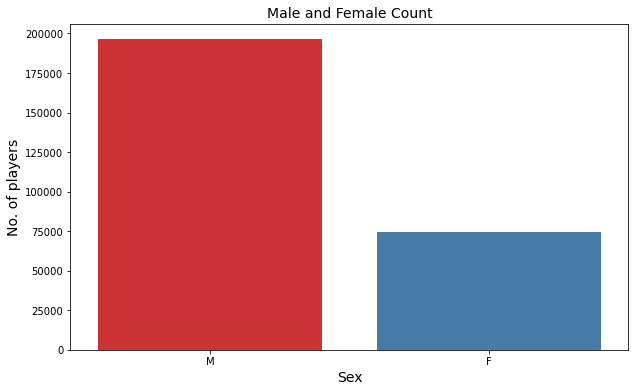

In [8]:

sex =athletes_df.Sex.value_counts().index
No_of_Olympians = athletes_df.Sex.value_counts()

sns.barplot(x = sex,y = No_of_Olympians, palette='Set1')

plt.xlabel("Sex",fontsize = 14)
plt.ylabel("No. of players",fontsize = 14)
plt.title("Male and Female Count",fontsize = 14)

visualizing  height among the sex 

In [9]:


fig = px.histogram(athletes_df,
                x = "Height",
                nbins = 90,
                marginal = "box",
                color = "Sex",
                title='Olympians Height Distribution')

fig.update_layout(bargap=0.1)
fig.show()

visualizing the age before cleaning the null values 

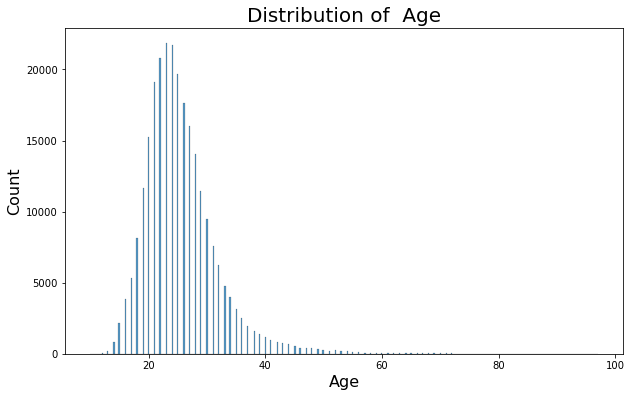

In [10]:

ax = sns.histplot(x='Age', data=athletes_df)
ax.set_title(label='Distribution of  Age', fontsize=20)

ax.set_xlabel(xlabel='Age', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)

plt.show()


 Weight  vs Height among the sex 

<AxesSubplot:xlabel='Height', ylabel='Weight'>

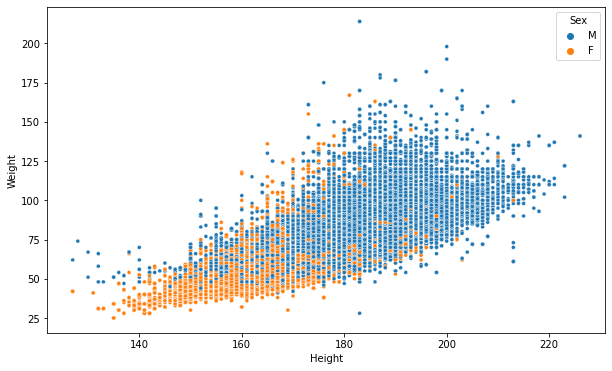

In [11]:

sns.scatterplot(data = athletes_df, x = 'Height',y = 'Weight',hue = 'Sex', s=15)

visualizing  medal before dealing with missing values in it

Text(0.5, 1.0, 'Medals Count')

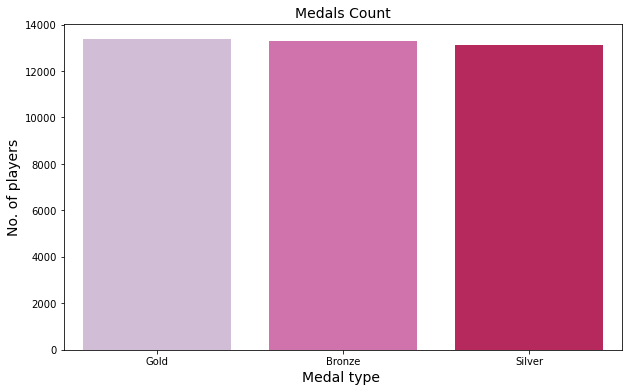

In [12]:

medal =athletes_df.Medal.value_counts().index
No_of_Olympians = athletes_df.Medal.value_counts()

sns.barplot(x=medal,y = No_of_Olympians, palette='PuRd')

plt.xlabel("Medal type ",fontsize = 14)
plt.ylabel("No. of players",fontsize = 14)
plt.title("Medals Count",fontsize = 14)

Fill null values of medal with No Medal

In [13]:
athletes_df_cleaned = athletes_df
athletes_df_cleaned["Medal"] = athletes_df_cleaned["Medal"].fillna('No Medal')
athletes_df_cleaned

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China,NaN
2,602,Abudoureheman,M,22.0,182.0,75.0,China,CHN,2000 Summer,2000,Summer,Sydney,Boxing,Boxing Men's Middleweight,No Medal,China,NaN
3,1463,Ai Linuer,M,25.0,160.0,62.0,China,CHN,2004 Summer,2004,Summer,Athina,Wrestling,"Wrestling Men's Lightweight, Greco-Roman",No Medal,China,NaN
4,1464,Ai Yanhan,F,14.0,168.0,54.0,China,CHN,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Women's 200 metres Freestyle,No Medal,China,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270762,120575,Mamorallo Tjoka,F,23.0,150.0,56.0,Lesotho,LES,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Women's Marathon,No Medal,Lesotho,NaN
270763,120575,Mamorallo Tjoka,F,27.0,150.0,56.0,Lesotho,LES,2012 Summer,2012,Summer,London,Athletics,Athletics Women's Marathon,No Medal,Lesotho,NaN
270764,122166,M'apotlaki Ts'elho,F,15.0,NaN,NaN,Lesotho,LES,1996 Summer,1996,Summer,Atlanta,Athletics,Athletics Women's 4 x 100 metres Relay,No Medal,Lesotho,NaN
270765,122215,Lefa Tsapi,M,23.0,170.0,63.0,Lesotho,LES,1984 Summer,1984,Summer,Los Angeles,Boxing,Boxing Men's Welterweight,No Medal,Lesotho,NaN


In [14]:
missing_values = athletes_df.isna().sum()/len(athletes_df)*100
missing_values

ID         0.000000
Name       0.000000
Sex        0.000000
Age        3.494517
Height    22.189927
Weight    23.187833
Team       0.000000
NOC        0.000000
Games      0.000000
Year       0.000000
Season     0.000000
City       0.000000
Sport      0.000000
Event      0.000000
Medal      0.000000
region     0.007756
notes     98.138990
dtype: float64

visualzing  medal after cleaning 

Text(0.5, 1.0, 'Medals Count')

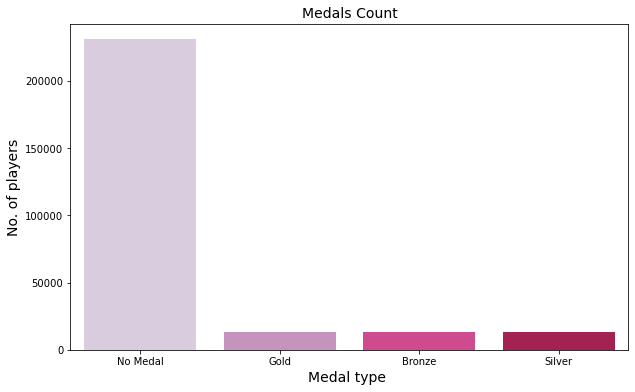

In [15]:

medal =athletes_df.Medal.value_counts().index
No_of_Olympians = athletes_df.Medal.value_counts()

sns.barplot(x=medal,y = No_of_Olympians, palette='PuRd')

plt.xlabel("Medal type ",fontsize = 14)
plt.ylabel("No. of players",fontsize = 14)
plt.title("Medals Count",fontsize = 14)

visualzing  season among the sex and Males are higher in both seasons

<AxesSubplot:xlabel='Season'>

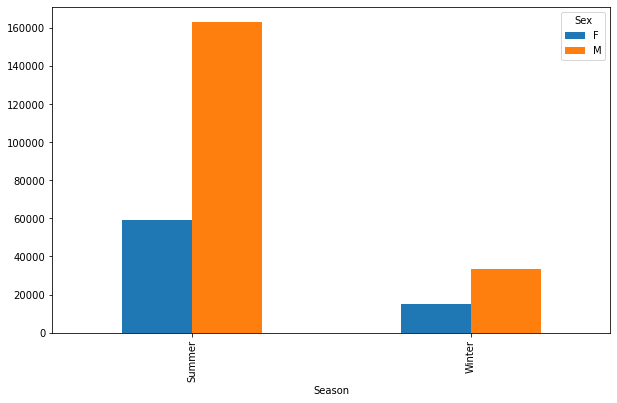

In [16]:

season_column = 'Sex'
athletes_df.groupby(["Season", season_column]).size().unstack(level=1).plot(kind='bar')


Cleaning the age by imputing the missing values 

In [17]:

imp = SimpleImputer(missing_values=np.nan,strategy='mean')
imp.fit(athletes_df_cleaned[['Age']])
athletes_df_cleaned['Age'] = data=imp.transform(athletes_df_cleaned[['Age']]).ravel()



plot after cleaning the age by histplot 

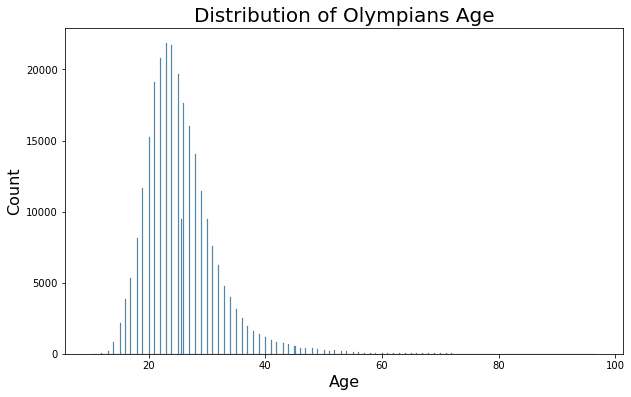

In [18]:

ax = sns.histplot(x='Age', data=athletes_df_cleaned)
ax.set_title(label='Distribution of Olympians Age', fontsize=20)

ax.set_xlabel(xlabel='Age', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)

plt.show()


Removing Outliers 

In [19]:
maxval = athletes_df["Height"].max()
print(maxval)

minval = athletes_df["Height"].min()
print(minval)

# Removing Outliers from weight using IQR
Q1 = athletes_df_removeoutliers_males["Weight"].quantile(0.25)
Q3 = athletes_df_removeoutliers_males["Weight"].quantile(0.75)
IQR = Q3-Q1
lowqe_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lowqe_bound, upper_bound)


athletes_df_removeoutliers_males = athletes_df_removeoutliers_males[~(
    (athletes_df_removeoutliers_males["Weight"] < lowqe_bound) | (athletes_df_removeoutliers_males["Weight"] > upper_bound))]
athletes_df_removeoutliers_males.shape

226.0
127.0
43.0 107.0


(193368, 17)

In [20]:
# Removing Outliers from Heightweight using IQR
Q1 = athletes_df_removeoutliers_males["Height"].quantile(0.25)
Q3 = athletes_df_removeoutliers_males["Height"].quantile(0.75)
IQR = Q3-Q1
lowqe_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lowqe_bound, upper_bound)


athletes_df_removeoutliers_males = athletes_df_removeoutliers_males[~(
    (athletes_df_removeoutliers_males["Height"] < lowqe_bound) | (athletes_df_removeoutliers_males["Height"] > upper_bound))]
athletes_df_removeoutliers_males.shape


athletes_df_removeoutliers_males["Medal"] = athletes_df_removeoutliers_males["Medal"].fillna(
    "No Medal")


152.5 204.5


In [21]:
Q1 = athletes_df_removeoutliers_females["Weight"].quantile(0.25)
Q3 = athletes_df_removeoutliers_females["Weight"].quantile(0.75)
IQR = Q3-Q1
lowqe_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lowqe_bound, upper_bound)


athletes_df_removeoutliers_females = athletes_df_removeoutliers_females[~(
    (athletes_df_removeoutliers_females["Weight"] < lowqe_bound) | (athletes_df_removeoutliers_females["Weight"] > upper_bound))]
athletes_df_removeoutliers_females.shape


37.5 81.5


(72077, 17)

In [22]:
# Removing Outliers from Heightweight using IQR
Q1 = athletes_df_removeoutliers_females["Height"].quantile(0.25)
Q3 = athletes_df_removeoutliers_females["Height"].quantile(0.75)
IQR = Q3-Q1
lowqe_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lowqe_bound, upper_bound)


athletes_df_removeoutliers_females = athletes_df_removeoutliers_females[~(
    (athletes_df_removeoutliers_females["Height"] < lowqe_bound) | (athletes_df_removeoutliers_females["Height"] > upper_bound))]
athletes_df_removeoutliers_females.shape


athletes_df_removeoutliers_females["Medal"] = athletes_df_removeoutliers_females["Medal"].fillna(
    "No Medal")

145.5 189.5


Plotting  Before & after handling 

[43. 44. 45. ... nan nan nan]


D:\anacondas\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\anacondas\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[153. 154. 155. ...  nan  nan  nan]


[Text(0.5, 0, 'Height'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Male Weight/Height')]

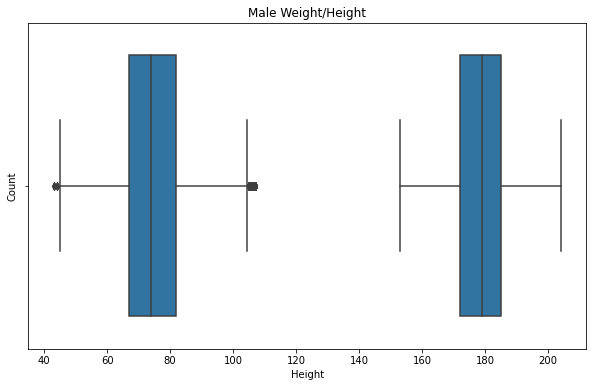

In [23]:
weightdistribution = athletes_df_removeoutliers_males["Weight"]
weightdistributionlist = weightdistribution.sort_values(ascending = True).values.tolist()

print(np.unique(weightdistributionlist))


ax = sns.boxplot(weightdistributionlist)
ax.set(xlabel="Weight",ylabel="Count")

weightdistribution = athletes_df_removeoutliers_males["Height"]
weightdistributionlist = weightdistribution.sort_values(ascending = True).values.tolist()

print(np.unique(weightdistributionlist))


ax = sns.boxplot(weightdistributionlist)
ax.set(xlabel="Height",ylabel="Count",title = "Male Weight/Height")

[38. 39. 40. ... nan nan nan]
[146. 147. 148. ...  nan  nan  nan]


D:\anacondas\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\anacondas\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 0, 'Height'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Female Weight/Height')]

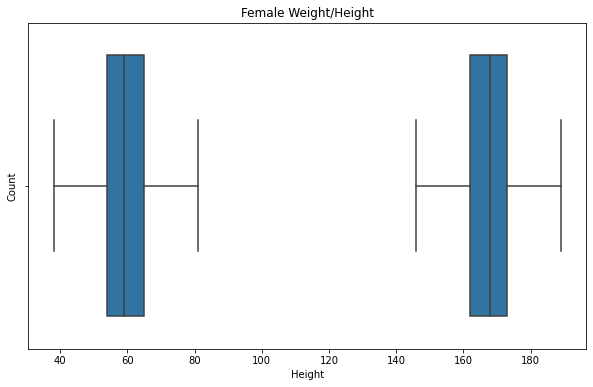

In [24]:
weightdistribution = athletes_df_removeoutliers_females["Weight"]
weightdistributionlist = weightdistribution.sort_values(ascending = True).values.tolist()

print(np.unique(weightdistributionlist))


ax = sns.boxplot(weightdistributionlist)
ax.set(xlabel="Weight",ylabel="Count")

weightdistribution = athletes_df_removeoutliers_females["Height"]
weightdistributionlist = weightdistribution.sort_values(ascending = True).values.tolist()

print(np.unique(weightdistributionlist))


ax = sns.boxplot(weightdistributionlist)
ax.set(xlabel="Height",ylabel="Count",title = "Female Weight/Height")

 IterativeImputer for missing_values 

In [25]:
athletes_df_imputed_males = athletes_df_removeoutliers_males


imp = IterativeImputer(missing_values=np.nan,
                       max_iter=20,tol=0.001)
imp.fit(athletes_df_imputed_males[['Weight']])
athletes_df_imputed_males['Weight'] = data=imp.transform(athletes_df_imputed_males[['Weight']]).ravel()


athletes_df_imputed_males = athletes_df_removeoutliers_males


imp = IterativeImputer(missing_values=np.nan,
                       max_iter=20,tol=0.001)
imp.fit(athletes_df_imputed_males[['Height']])
athletes_df_imputed_males['Height'] = data=imp.transform(athletes_df_imputed_males[['Height']]).ravel()

In [26]:
athletes_df_imputed_females = athletes_df_removeoutliers_females


imp = IterativeImputer(missing_values=np.nan,
                       max_iter=20,tol=0.001)
imp.fit(athletes_df_imputed_females[['Weight']])
athletes_df_imputed_females['Weight'] = data=imp.transform(athletes_df_imputed_females[['Weight']]).ravel()


athletes_df_imputed_females = athletes_df_removeoutliers_females


imp = IterativeImputer(missing_values=np.nan,
                       max_iter=20,tol=0.001)
imp.fit(athletes_df_imputed_females[['Height']])
athletes_df_imputed_females['Height'] = data=imp.transform(athletes_df_imputed_females[['Height']]).ravel()

In [27]:
missing_values =athletes_df_imputed_females.isna().sum()/len(athletes_df)*100
missing_values

ID         0.000000
Name       0.000000
Sex        0.000000
Age        0.153638
Height     0.000000
Weight     0.000000
Team       0.000000
NOC        0.000000
Games      0.000000
Year       0.000000
Season     0.000000
City       0.000000
Sport      0.000000
Event      0.000000
Medal      0.000000
region     0.002585
notes     26.063737
dtype: float64

Text(0.5, 1.0, 'Olympics Male Medalists Weights')

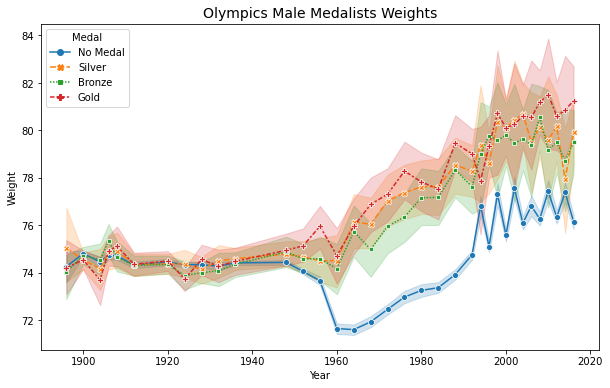

In [28]:
sns.lineplot(x = "Year",y = "Weight",data = athletes_df_imputed_males,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Male Medalists Weights",fontsize = 14)

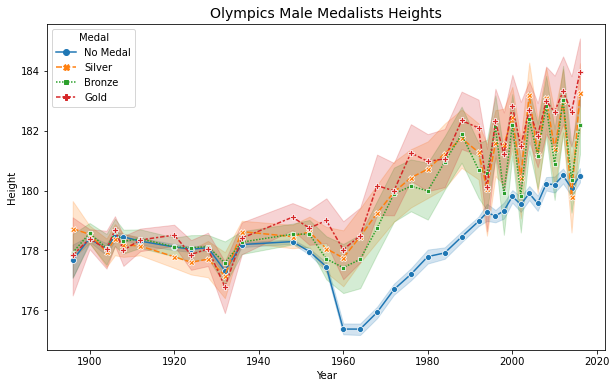

In [29]:
sns.lineplot(x = "Year",y = "Height",data = athletes_df_imputed_males,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Male Medalists Heights",fontsize = 14);

In [30]:
#We calculate the percentage of missing values in each attribute after cleaning the attribute (Age)(Without Weight/Height imputations)
missing_values = athletes_df_cleaned.isna().sum()/len(athletes_df)*100
missing_values

ID         0.000000
Name       0.000000
Sex        0.000000
Age        0.000000
Height    22.189927
Weight    23.187833
Team       0.000000
NOC        0.000000
Games      0.000000
Year       0.000000
Season     0.000000
City       0.000000
Sport      0.000000
Event      0.000000
Medal      0.000000
region     0.007756
notes     98.138990
dtype: float64

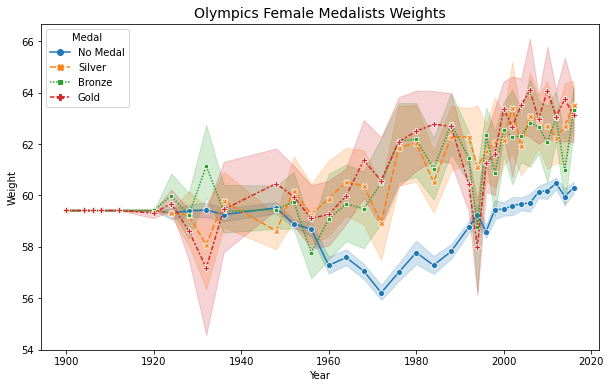

In [31]:
sns.lineplot(x = "Year",y = "Weight",data = athletes_df_imputed_females,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Female Medalists Weights",fontsize = 14);

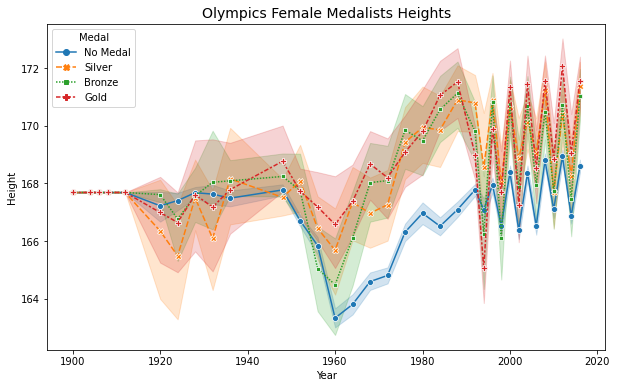

In [32]:
sns.lineplot(x = "Year",y = "Height",data = athletes_df_imputed_females,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Female Medalists Heights",fontsize = 14);

<AxesSubplot:xlabel='Weight', ylabel='Sport'>

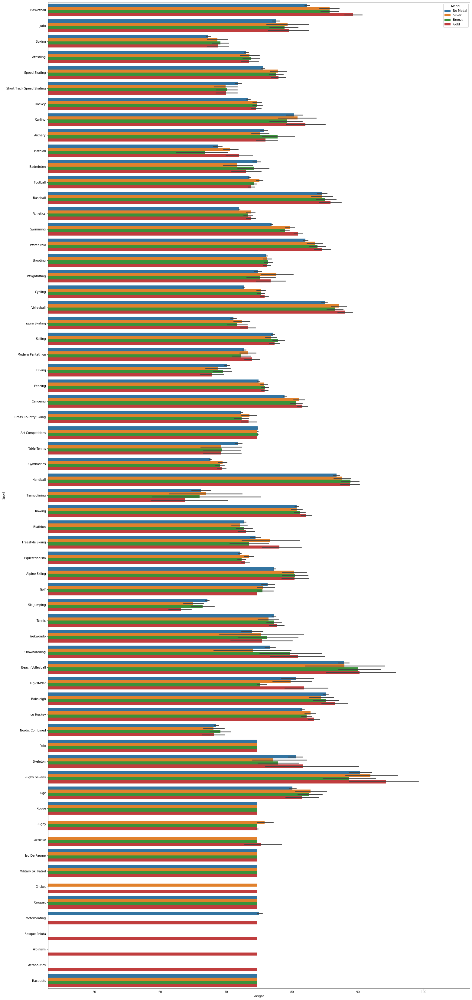

In [33]:
plt.figure(figsize=(25,60))
plt.xlim(athletes_df_imputed_males["Weight"].min(),athletes_df_imputed_males["Weight"].max())
sns.barplot(y = "Sport",x= "Weight",data= athletes_df_imputed_males,hue = "Medal")

<AxesSubplot:xlabel='Height', ylabel='Sport'>

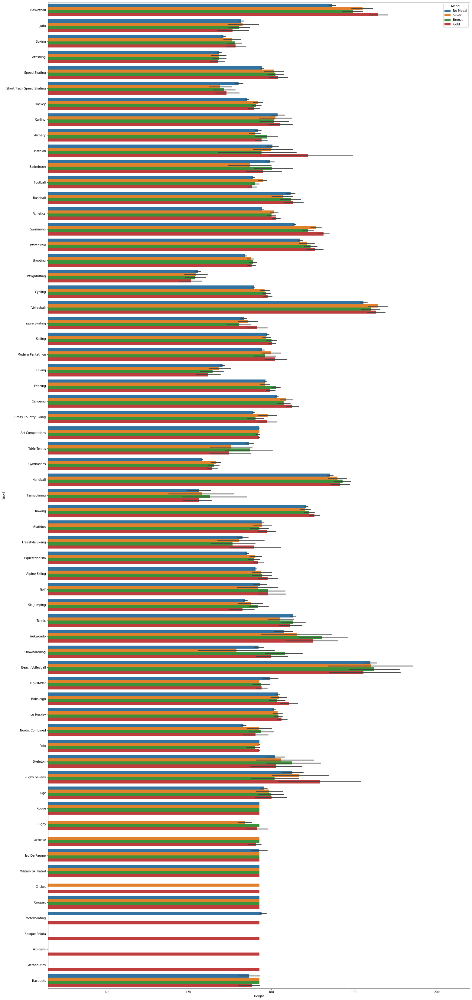

In [34]:
plt.figure(figsize=(25,60))
plt.xlim(athletes_df_imputed_males["Height"].min(),athletes_df_imputed_males["Height"].max())
sns.barplot(y = "Sport",x= "Height",data= athletes_df_imputed_males,hue = "Medal")

<AxesSubplot:xlabel='Weight', ylabel='Sport'>

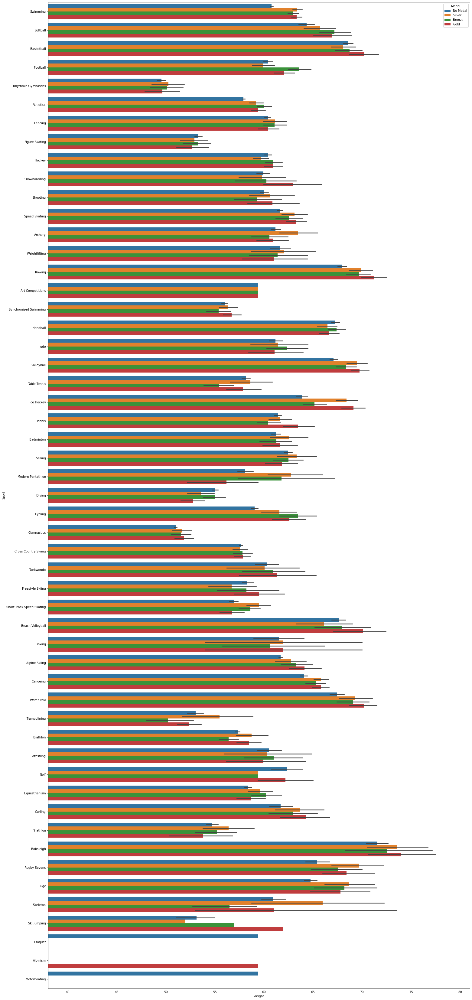

In [35]:
plt.figure(figsize=(25,60))
plt.xlim(athletes_df_imputed_females["Weight"].min(),athletes_df_imputed_females["Weight"].max())
sns.barplot(y = "Sport",x= "Weight",data= athletes_df_imputed_females,hue = "Medal")

<AxesSubplot:xlabel='Height', ylabel='Sport'>

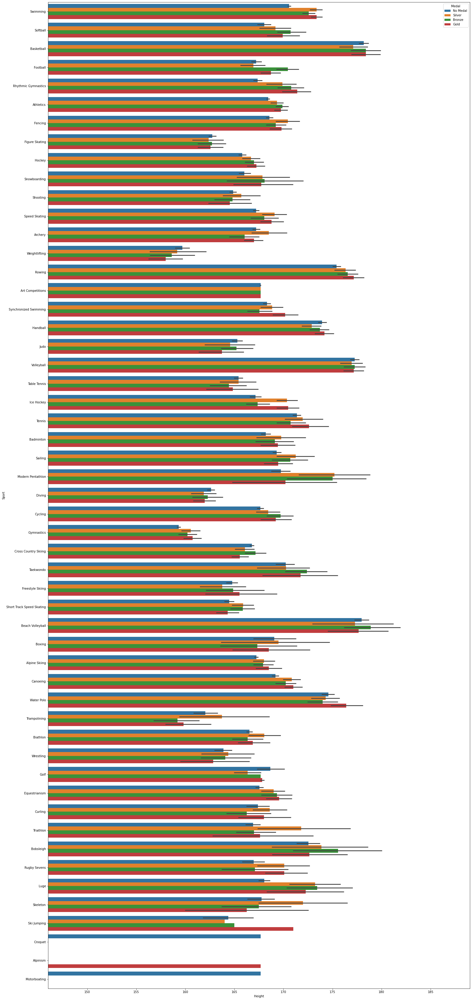

In [36]:
plt.figure(figsize=(25,60))
plt.xlim(athletes_df_imputed_females["Height"].min(),athletes_df_imputed_females["Height"].max())
sns.barplot(y = "Sport",x= "Height",data= athletes_df_imputed_females,hue = "Medal")

Calcuting each type of medals won in top 10 teams

In [37]:

No_Medal_data = athletes_df_cleaned['Medal']==('No Medal')
No_Medal=athletes_df_cleaned[No_Medal_data]
n_No_Medal =No_Medal.groupby("Team")['Medal'].count().sort_values(ascending=False).nlargest(n=10)

#Prints what we just computed
n_No_Medal

Team
United States    12628
France           10438
Great Britain     9731
Italy             8733
Canada            8036
Japan             7378
Germany           7342
Sweden            6618
Australia         6207
Poland            5580
Name: Medal, dtype: int64

Visualize n_No_Medal medals

Text(0.5, 1.0, 'No Medal medals')

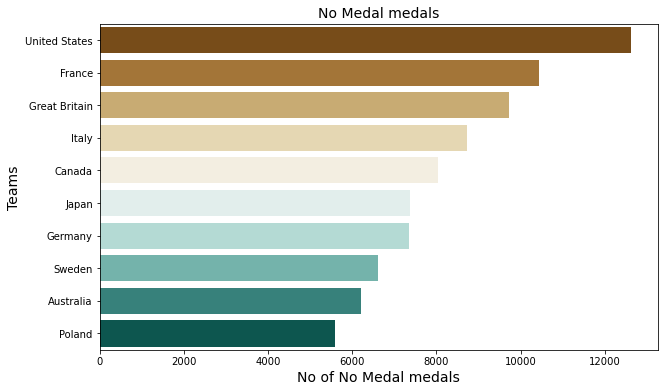

In [38]:

No_Medal =n_No_Medal.value_counts().index.sort_values(ascending=False)
g_teams =n_No_Medal.index

sns.barplot(x=No_Medal,y = g_teams, palette='BrBG')

plt.xlabel("No of No Medal medals",fontsize = 14)
plt.ylabel("Teams",fontsize = 14)
plt.title("No Medal medals",fontsize = 14)

In [39]:
gold_data = athletes_df_cleaned['Medal']==('Gold')
Golds=athletes_df_cleaned[gold_data]
n_golds =Golds.groupby("Team")['Medal'].count().sort_values(ascending=False).nlargest(n=10)

#Prints what we just computed
n_golds

Team
United States    2474
Soviet Union     1058
Germany           679
Italy             535
Great Britain     519
France            455
Sweden            451
Hungary           432
Canada            422
East Germany      369
Name: Medal, dtype: int64

visualize gold medals

Text(0.5, 1.0, 'Gold medals')

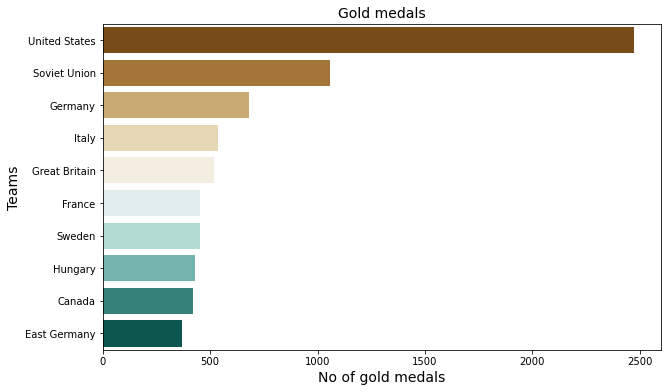

In [40]:

gold_medal =n_golds.value_counts().index.sort_values(ascending=False)
g_teams =n_golds.index

sns.barplot(x=gold_medal,y = g_teams, palette='BrBG')

plt.xlabel("No of gold medals",fontsize = 14)
plt.ylabel("Teams",fontsize = 14)
plt.title("Gold medals",fontsize = 14)

In [41]:
bronze_data = athletes_df_cleaned['Medal']=='Bronze'
Bronzes=athletes_df_cleaned[bronze_data]

n_bronzes =Bronzes.groupby("Team")['Medal'].count().sort_values(ascending=False).nlargest(n=10)

#Prints what we just computed
n_bronzes

Team
United States    1233
Germany           678
Soviet Union      677
France            577
Great Britain     572
Australia         511
Sweden            507
Italy             484
Finland           415
Canada            408
Name: Medal, dtype: int64

visualize bronze medals

Text(0.5, 1.0, 'Bronze medals')

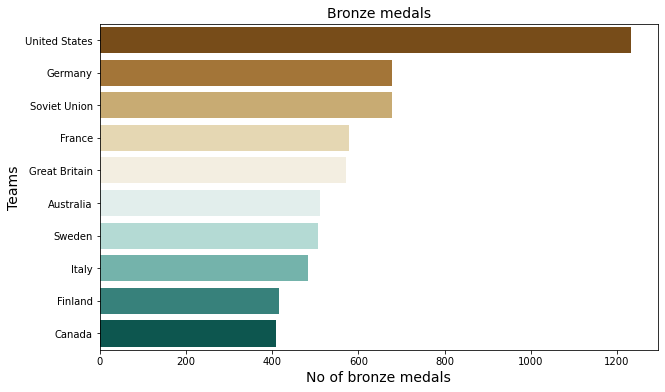

In [42]:

bronze_medal =n_bronzes.value_counts().index.sort_values(ascending=False)
b_teams =n_bronzes.index

sns.barplot(x=bronze_medal, y= b_teams, palette='BrBG')

plt.xlabel("No of bronze medals",fontsize = 14)
plt.ylabel("Teams",fontsize = 14)
plt.title("Bronze medals",fontsize = 14)

In [43]:
#calcualte  the silver 
silver_data = athletes_df_cleaned['Medal']=='Silver'
Silvers=athletes_df_cleaned[silver_data]
n_silvers =Silvers.groupby("Team")['Medal'].count().sort_values(ascending=False).nlargest(n=10)

#Prints what we just computed
n_silvers


Team
United States    1512
Soviet Union      716
Germany           627
Great Britain     582
France            518
Italy             508
Sweden            476
Australia         453
Canada            413
Russia            351
Name: Medal, dtype: int64

visualize silver medals

Text(0.5, 1.0, 'Silver medals')

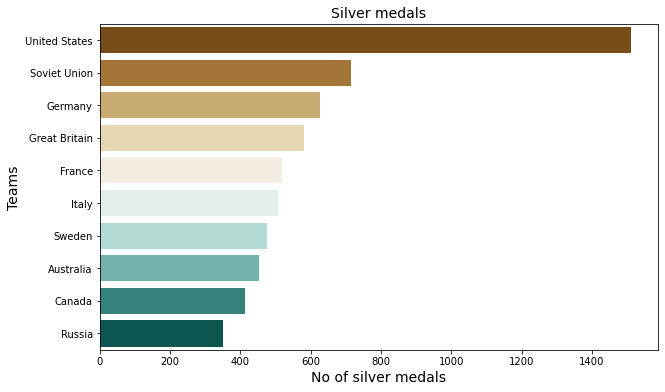

In [44]:

silver_medal =n_silvers.value_counts().index.sort_values(ascending=False)
s_teams =n_silvers.index

sns.barplot(x=silver_medal, y=s_teams, palette='BrBG')

plt.xlabel("No of silver medals",fontsize = 14)
plt.ylabel("Teams",fontsize = 14)
plt.title("Silver medals",fontsize = 14)

# Clearly, the United States and the Soviet Union have dominated all three medals in the Olympics.

In [45]:
data = pd.read_csv('noc_regions.csv')
data.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


- here we will filter the data on the teams that only got medals

In [46]:
Medals = ['Gold', 'Bronze', 'Silver']
winners = df[df['Medal'].isin(Medals)]
the_new_data=winners[['Team','NOC','Medal','Year']]

the_new_data

,Team,NOC,Medal,Year
8,China,CHN,Silver,1998
10,China,CHN,Bronze,1998
11,China,CHN,Bronze,2002
12,China,CHN,Silver,1996
17,China,CHN,Bronze,1984
...,...,...,...,...
270486,Vietnam,VIE,Silver,2008
270492,Vietnam,VIE,Gold,2016
270493,Vietnam,VIE,Silver,2016
270596,Vietnam,VIE,Silver,2000


- Here we will calculate how many medals each Team has won for each Year

In [47]:
medals=the_new_data.groupby(['NOC','Year'])['Medal'].value_counts().unstack().fillna(0)
new=pd.merge(medals,the_new_data,on=['NOC','Year'])
new

,NOC,Year,Bronze,Gold,Silver,Team,Medal
0,AFG,2008,1.0,0.0,0.0,Afghanistan,Bronze
1,AFG,2012,1.0,0.0,0.0,Afghanistan,Bronze
2,AHO,1988,0.0,0.0,1.0,Netherlands Antilles,Silver
3,ALG,1984,2.0,0.0,0.0,Algeria,Bronze
4,ALG,1984,2.0,0.0,0.0,Algeria,Bronze
...,...,...,...,...,...,...,...
39769,ZIM,2004,1.0,1.0,1.0,Zimbabwe,Bronze
39770,ZIM,2008,0.0,1.0,3.0,Zimbabwe,Silver
39771,ZIM,2008,0.0,1.0,3.0,Zimbabwe,Gold
39772,ZIM,2008,0.0,1.0,3.0,Zimbabwe,Silver


In [48]:
new.drop(columns=['Medal'], inplace=True)
new

,NOC,Year,Bronze,Gold,Silver,Team
0,AFG,2008,1.0,0.0,0.0,Afghanistan
1,AFG,2012,1.0,0.0,0.0,Afghanistan
2,AHO,1988,0.0,0.0,1.0,Netherlands Antilles
3,ALG,1984,2.0,0.0,0.0,Algeria
4,ALG,1984,2.0,0.0,0.0,Algeria
...,...,...,...,...,...,...
39769,ZIM,2004,1.0,1.0,1.0,Zimbabwe
39770,ZIM,2008,0.0,1.0,3.0,Zimbabwe
39771,ZIM,2008,0.0,1.0,3.0,Zimbabwe
39772,ZIM,2008,0.0,1.0,3.0,Zimbabwe


In [49]:
new_duplicates_removed=new.drop_duplicates()
new_duplicates_removed

,NOC,Year,Bronze,Gold,Silver,Team
0,AFG,2008,1.0,0.0,0.0,Afghanistan
1,AFG,2012,1.0,0.0,0.0,Afghanistan
2,AHO,1988,0.0,0.0,1.0,Netherlands Antilles
3,ALG,1984,2.0,0.0,0.0,Algeria
5,ALG,1992,1.0,1.0,0.0,Algeria
...,...,...,...,...,...,...
39750,ZAM,1984,1.0,0.0,0.0,Zambia
39751,ZAM,1996,0.0,0.0,1.0,Zambia
39752,ZIM,1980,0.0,15.0,0.0,Zimbabwe
39767,ZIM,2004,1.0,1.0,1.0,Zimbabwe


- Add & calculate a new feature "Total" which exists in the dataframe Medals

In [50]:
new_duplicates_removed['Total']=new_duplicates_removed['Bronze']+new_duplicates_removed['Gold']+new_duplicates_removed['Silver']
new_duplicates_removed

<ipython-input-50-89cffb181b80>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,NOC,Year,Bronze,Gold,Silver,Team,Total
0,AFG,2008,1.0,0.0,0.0,Afghanistan,1.0
1,AFG,2012,1.0,0.0,0.0,Afghanistan,1.0
2,AHO,1988,0.0,0.0,1.0,Netherlands Antilles,1.0
3,ALG,1984,2.0,0.0,0.0,Algeria,2.0
5,ALG,1992,1.0,1.0,0.0,Algeria,2.0
...,...,...,...,...,...,...,...
39750,ZAM,1984,1.0,0.0,0.0,Zambia,1.0
39751,ZAM,1996,0.0,0.0,1.0,Zambia,1.0
39752,ZIM,1980,0.0,15.0,0.0,Zimbabwe,15.0
39767,ZIM,2004,1.0,1.0,1.0,Zimbabwe,3.0


- Read Medals data



In [51]:
Medals=pd.read_excel('Medals.xlsx')

Medals

,Rank,Team/NOC,Gold,Silver,Bronze,Total,Rank by Total
0,1,United States of America,39,41,33,113,1
1,2,People's Republic of China,38,32,18,88,2
2,3,Japan,27,14,17,58,5
3,4,Great Britain,22,21,22,65,4
4,5,ROC,20,28,23,71,3
...,...,...,...,...,...,...,...
88,86,Ghana,0,0,1,1,77
89,86,Grenada,0,0,1,1,77
90,86,Kuwait,0,0,1,1,77
91,86,Republic of Moldova,0,0,1,1,77


-data gives the rank-wise medal record of each country.

-Note that USA is on the top followed by China and Japan.

-Data has zero duplicate and zero null row entry.

-Data has 93 rows and 7 columns

In [52]:
print(Medals.info())
print()
print(Medals.nunique())
print()
print(Medals.duplicated().sum())
print()
print(Medals.isnull().sum())
print()
print(Medals.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93 entries, 0 to 92
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Rank           93 non-null     int64 
 1   Team/NOC       93 non-null     object
 2   Gold           93 non-null     int64 
 3   Silver         93 non-null     int64 
 4   Bronze         93 non-null     int64 
 5   Total          93 non-null     int64 
 6   Rank by Total  93 non-null     int64 
dtypes: int64(6), object(1)
memory usage: 5.2+ KB
None

Rank             67
Team/NOC         93
Gold             14
Silver           17
Bronze           21
Total            30
Rank by Total    30
dtype: int64

0

Rank             0
Team/NOC         0
Gold             0
Silver           0
Bronze           0
Total            0
Rank by Total    0
dtype: int64

(93, 7)


- Adding the feature "Year" with 2020 at Medals df

In [53]:
years=np.array(2020)
Medals['Year']=years
Medals


,Rank,Team/NOC,Gold,Silver,Bronze,Total,Rank by Total,Year
0,1,United States of America,39,41,33,113,1,2020
1,2,People's Republic of China,38,32,18,88,2,2020
2,3,Japan,27,14,17,58,5,2020
3,4,Great Britain,22,21,22,65,4,2020
4,5,ROC,20,28,23,71,3,2020
...,...,...,...,...,...,...,...,...
88,86,Ghana,0,0,1,1,77,2020
89,86,Grenada,0,0,1,1,77,2020
90,86,Kuwait,0,0,1,1,77,2020
91,86,Republic of Moldova,0,0,1,1,77,2020


- Here we are trying to match the columns names in Medals with the columns names in new
 

In [54]:
Medals.rename(columns = {'Team/NOC':'Team'}, inplace = True)
NOCs=np.array(1)
Medals['NOC']=NOCs
Medals



,Rank,Team,Gold,Silver,Bronze,Total,Rank by Total,Year,NOC
0,1,United States of America,39,41,33,113,1,2020,1
1,2,People's Republic of China,38,32,18,88,2,2020,1
2,3,Japan,27,14,17,58,5,2020,1
3,4,Great Britain,22,21,22,65,4,2020,1
4,5,ROC,20,28,23,71,3,2020,1
...,...,...,...,...,...,...,...,...,...
88,86,Ghana,0,0,1,1,77,2020,1
89,86,Grenada,0,0,1,1,77,2020,1
90,86,Kuwait,0,0,1,1,77,2020,1
91,86,Republic of Moldova,0,0,1,1,77,2020,1


In [55]:
for i in range(len(Medals)):
    if((Medals['Team'][i])=='United States of America'):
        Medals['NOC'][i]='USA'
    elif((Medals['Team'][i])=="People's Republic of China"):
        Medals['NOC'][i]='CHN'
    elif((Medals['Team'][i])=="Japan"):
        Medals['NOC'][i]='JPN'
    elif((Medals['Team'][i])=="Great Britain"):
        Medals['NOC'][i]='GBR'
    elif((Medals['Team'][i])=="ROC"):
        Medals['NOC'][i]='ROC'
    elif((Medals['Team'][i])=="Australia"):
        Medals['NOC'][i]='AUS'
    elif((Medals['Team'][i])=="Netherlands"):
        Medals['NOC'][i]='NED'
    elif((Medals['Team'][i])=="France"):
        Medals['NOC'][i]='FRA'
    elif((Medals['Team'][i])=="Germany"):
        Medals['NOC'][i]='GER'
    elif((Medals['Team'][i])=="Italy"):
        Medals['NOC'][i]='ITA'
    elif((Medals['Team'][i])=="Canada"):
        Medals['NOC'][i]='CAN'
    elif((Medals['Team'][i])=="Brazil"):
        Medals['NOC'][i]='BRA'
    elif((Medals['Team'][i])=="New Zealand"):
        Medals['NOC'][i]='NZL'
    elif((Medals['Team'][i])=="Cuba"):
        Medals['NOC'][i]='CUB'
    elif((Medals['Team'][i])=="Hungary"):
        Medals['NOC'][i]='HUN'
    elif((Medals['Team'][i])=="Republic of Korea"):
        Medals['NOC'][i]='KOR'
    elif((Medals['Team'][i])=="Poland"):
        Medals['NOC'][i]='POL'
    elif((Medals['Team'][i])=="Czech Republic"):
        Medals['NOC'][i]='CZE'
    elif((Medals['Team'][i])=="Kenya"):
        Medals['NOC'][i]='KEN'
    elif((Medals['Team'][i])=="Norway"):
        Medals['NOC'][i]='NOR'
    elif((Medals['Team'][i])=="Jamaica"):
        Medals['NOC'][i]='JAM'
    elif((Medals['Team'][i])=="Spain"):
        Medals['NOC'][i]='ESP'
    elif((Medals['Team'][i])=="Sweden"):
        Medals['NOC'][i]='SWE'
    elif((Medals['Team'][i])=="Switzerland"):
        Medals['NOC'][i]='SUI'
    elif((Medals['Team'][i])=="Denmark"):
        Medals['NOC'][i]='DEN'
    elif((Medals['Team'][i])=="Croatia"):
        Medals['NOC'][i]='CRO'
    elif((Medals['Team'][i])=="Islamic Republic of Iran"):
        Medals['NOC'][i]='IRI'
    elif((Medals['Team'][i])=="Serbia"):
        Medals['NOC'][i]='SRB'
    elif((Medals['Team'][i])=="Belgium"):
        Medals['NOC'][i]='BEL'
    elif((Medals['Team'][i])=="Slovenia"):
        Medals['NOC'][i]='SLO'
    elif((Medals['Team'][i])=="Uzbekistan"):
        Medals['NOC'][i]='UZB'
    elif((Medals['Team'][i])=="Georgia"):
        Medals['NOC'][i]='GEO'
    elif((Medals['Team'][i])=="Chinese Taipei"):
        Medals['NOC'][i]='TPE'
    elif((Medals['Team'][i])=="Turkey"):
        Medals['NOC'][i]='TUR'
    elif((Medals['Team'][i])=="Greece"):
        Medals['NOC'][i]='GRE'
    elif((Medals['Team'][i])=="Uganda"):
        Medals['NOC'][i]='UGA'
    elif((Medals['Team'][i])=="Ecuador"):
        Medals['NOC'][i]='ECU'
    elif((Medals['Team'][i])=="Ireland"):
        Medals['NOC'][i]='IRL'
    elif((Medals['Team'][i])=="Israel"):
        Medals['NOC'][i]='ISR'
    elif((Medals['Team'][i])=="Qatar"):
        Medals['NOC'][i]='QAT'
    elif((Medals['Team'][i])=="Bahamas"):
        Medals['NOC'][i]='BAH'
    elif((Medals['Team'][i])=="Kosovo"):
        Medals['NOC'][i]='KOS'
    elif((Medals['Team'][i])=="Ukraine"):
        Medals['NOC'][i]='UKR'
    elif((Medals['Team'][i])=="Belarus"):
        Medals['NOC'][i]='BLR'
    elif((Medals['Team'][i])=="Romania"):
        Medals['NOC'][i]='ROU'
    elif((Medals['Team'][i])=="Venezuela"):
        Medals['NOC'][i]='VEN'
    elif((Medals['Team'][i])=="India"):
        Medals['NOC'][i]='IND'
    elif((Medals['Team'][i])=="Hong Kong, China"):
        Medals['NOC'][i]='CHN'
    elif((Medals['Team'][i])=="Philippines"):
        Medals['NOC'][i]='PHI'
    
    elif (Medals['Team'][i]=='Syrian Arab Republic'):
       Medals['NOC'][i]='SYR'
    elif(Medals['Team'][i]=='Republic of Moldova'):   
        Medals['NOC'][i]='MDA'
    elif (Medals['Team'][i]=='Kuwait'):
        Medals['NOC'][i]='KUW'
    elif (Medals['Team'][i]=='Grenada'):
        Medals['NOC'][i]='GRN'    
    elif (Medals['Team'][i]=='Ghana'):
        Medals['NOC'][i]='GHA'    
    elif (Medals['Team'][i]=="Côte d'Ivoire"):
        Medals['NOC'][i]="Côte d'Ivoire"   
    elif (Medals['Team'][i]=='Burkina Faso'):
        Medals['NOC'][i]='BUR'    
    elif (Medals['Team'][i]=='Botswana'):
        Medals['NOC'][i]='BOT'    
    elif (Medals['Team'][i]=='Finland'):
        Medals['NOC'][i]='FIN'    
    elif (Medals['Team'][i]=='Mexico'):
        Medals['NOC'][i]='MEX'    
    elif (Medals['Team'][i]=='Kazakhstan'):
        Medals['NOC'][i]='KAZ'    
    elif (Medals['Team'][i]=='Turkmenistan'):
        Medals['NOC'][i]='TKM'    
    elif (Medals['Team'][i]=='Namibia'):
        Medals['NOC'][i]='NAM'    
    elif (Medals['Team'][i]=='North Macedonia'):
        Medals['NOC'][i]='MKD'
    elif (Medals['Team'][i]=='Lithuania'):
        Medals['NOC'][i]='LTU'
    elif (Medals['Team'][i]=='Saudi Arabia'):
        Medals['NOC'][i]='KSA'
    elif (Medals['Team'][i]=='Bahrain'):
        Medals['NOC'][i]='BRN'
    elif (Medals['Team'][i]=='Nigeria'):
        Medals['NOC'][i]='NGR'
    elif (Medals['Team'][i]=='Malaysia'):
        Medals['NOC'][i]='MAL'
    elif (Medals['Team'][i]=='Jordan'):
        Medals['NOC'][i]='JOR'
    elif (Medals['Team'][i]=='San Marino'):
        Medals['NOC'][i]='SMR'        
    elif (Medals['Team'][i]=='Argentina'):
        Medals['NOC'][i]='ARG' 
    elif (Medals['Team'][i]=='Mongolia'):
        Medals['NOC'][i]='MGL'        
    elif (Medals['Team'][i]=='Kyrgyzstan'):
        Medals['NOC'][i]='KGZ' 
    elif (Medals['Team'][i]=='Armenia'):
        Medals['NOC'][i]='ARM'        
    elif (Medals['Team'][i]=='Dominican Republic'):
        Medals['NOC'][i]='DOM'        
    elif (Medals['Team'][i]=='Azerbaijan'):
        Medals['NOC'][i]='AZE'        
    elif (Medals['Team'][i]=='Colombia'):
        Medals['NOC'][i]='COL'        
    elif (Medals['Team'][i]=='Puerto Rico'):
        Medals['NOC'][i]='PUR' 
    elif (Medals['Team'][i]=='Morocco'):
        Medals['NOC'][i]='MAR' 
    elif (Medals['Team'][i]=='Bermuda'):
        Medals['NOC'][i]='BER'
    elif (Medals['Team'][i]=='Thailand'):
        Medals['NOC'][i]='THA' 
    elif (Medals['Team'][i]=='Latvia'):
        Medals['NOC'][i]='LAT'  
    elif (Medals['Team'][i]=='Fiji'):
        Medals['NOC'][i]='FIJ'               
    elif (Medals['Team'][i]=='Estonia'):
        Medals['NOC'][i]='EST' 
    elif (Medals['Team'][i]=='Tunisia'):
        Medals['NOC'][i]='TUN' 
    elif (Medals['Team'][i]=='Portugal'):
        Medals['NOC'][i]='POR'     
    elif (Medals['Team'][i]=='Ethiopia'):
        Medals['NOC'][i]='ETH'
    elif (Medals['Team'][i]=='Indonesia'):
        Medals['NOC'][i]='INA'
    elif (Medals['Team'][i]=='Egypt'):
        Medals['NOC'][i]='EGY'
    elif (Medals['Team'][i]=='Austria'):
        Medals['NOC'][i]='AUT'
    elif (Medals['Team'][i]=='South Africa'):
        Medals['NOC'][i]='RSA'
    elif (Medals['Team'][i]=='Slovakia'):
        Medals['NOC'][i]='SVK'
        
Medals

<ipython-input-55-7dbd4f120ec3>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

D:\anacondas\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-55-7dbd4f120ec3>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-55-7dbd4f120ec3>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https

,Rank,Team,Gold,Silver,Bronze,Total,Rank by Total,Year,NOC
0,1,United States of America,39,41,33,113,1,2020,USA
1,2,People's Republic of China,38,32,18,88,2,2020,CHN
2,3,Japan,27,14,17,58,5,2020,JPN
3,4,Great Britain,22,21,22,65,4,2020,GBR
4,5,ROC,20,28,23,71,3,2020,ROC
...,...,...,...,...,...,...,...,...,...
88,86,Ghana,0,0,1,1,77,2020,GHA
89,86,Grenada,0,0,1,1,77,2020,GRN
90,86,Kuwait,0,0,1,1,77,2020,KUW
91,86,Republic of Moldova,0,0,1,1,77,2020,MDA


In [56]:
Final = pd.concat([new_duplicates_removed, Medals],axis=0)
Final

,NOC,Year,Bronze,Gold,Silver,Team,Total,Rank,Rank by Total
0,AFG,2008,1.0,0.0,0.0,Afghanistan,1.0,NaN,NaN
1,AFG,2012,1.0,0.0,0.0,Afghanistan,1.0,NaN,NaN
2,AHO,1988,0.0,0.0,1.0,Netherlands Antilles,1.0,NaN,NaN
3,ALG,1984,2.0,0.0,0.0,Algeria,2.0,NaN,NaN
5,ALG,1992,1.0,1.0,0.0,Algeria,2.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
88,GHA,2020,1.0,0.0,0.0,Ghana,1.0,86.0,77.0
89,GRN,2020,1.0,0.0,0.0,Grenada,1.0,86.0,77.0
90,KUW,2020,1.0,0.0,0.0,Kuwait,1.0,86.0,77.0
91,MDA,2020,1.0,0.0,0.0,Republic of Moldova,1.0,86.0,77.0


- Here we're going to add two features:
  
  
   1- Rank:rank by Gold medals
  
  
   2- Rank by Total: rank by total medals

In [57]:
Final['Rank'] = Final['Gold'].rank(method='dense',ascending = 0).astype(int)
Final['Rank by Total'] = Final['Total'].rank(method='dense',ascending = 0).astype(int)

In [58]:

Final.sort_values(by = ['Rank','Rank by Total'], ascending = [True,False], inplace=True)

In [59]:
Final

,NOC,Year,Bronze,Gold,Silver,Team,Total,Rank,Rank by Total
32684,URS,1980,133.0,205.0,158.0,Soviet Union,496.0,1,1
32761,URS,1980,133.0,205.0,158.0,Soviet Union-2,496.0,1,1
32844,URS,1980,133.0,205.0,158.0,Soviet Union-1,496.0,1,1
36546,USA,1984,50.0,190.0,121.0,United States,361.0,2,5
36602,USA,1984,50.0,190.0,121.0,United States-1,361.0,2,5
...,...,...,...,...,...,...,...,...,...
9057,FIN,2006,7.0,0.0,34.0,Finland,41.0,93,127
9103,FIN,2010,46.0,0.0,1.0,Finland,47.0,93,121
3017,BRA,2000,36.0,0.0,12.0,Brazil,48.0,93,120
3020,BRA,2000,36.0,0.0,12.0,Brazil-1,48.0,93,120


# Each Country with it's Total medal count using medal data set 
# The different colors indicate different conteries 
Move the cursor over any country to know number of medals won by that country.  


In [60]:
plt.figure(figsize=(100,70))
px.choropleth(Medals,locations="Team", 
                    locationmode='country names', color="Total", 
                    hover_name="Total", 
                    color_continuous_scale="turbo", 
                    title='Total medals won by Countries')

<Figure size 7200x5040 with 0 Axes>

# Each Country with it's Total medal count using the final integrated data set

Note:Plotly is pretty much interactive library.

Move the cursor over any country to know number of medals won by that country.

In [61]:
fig = px.choropleth(Final, locations="Team", 
                    locationmode='country names', color="NOC", 
                    hover_name="Total", range_color=[1,100], 
                    color_continuous_scale="blues", 
                    title='Density of Countries in 2020')
fig.update(layout_coloraxis_showscale=True)
fig.show()
                  

# This plot shows Rank among years vs Total medal won by each country.

# URS has biggest circle size and has rank one with maximum Total score
# USA has the second biggest circle size 


In [62]:
px.scatter(Final, x="Rank", y="Year",size="Total", color="NOC",hover_name="NOC", log_x=True, size_max=60)

# This ploty shows the  total vs the years  and the biggest circle have the highest number of silver medals

_URS in year 1980 have the highest number of silver 


In [63]:
px.scatter(Final, x="Total", y="Year",size="Silver", color="NOC",hover_name="NOC", log_x=True, size_max=60)

as the bubble gets bigger the number of gold medals gained are more

In [64]:
px.scatter(Final, x="Total", y="Year",size="Gold", color="NOC",hover_name="NOC", log_x=True, size_max=60)

as the bubble gets bigger the number of bronze medals gained are more

In [65]:
px.scatter(Final, x="Total", y="Year",size="Bronze", color="NOC",hover_name="NOC", log_x=True, size_max=60)

This bar plot shows the number of gold medals gained by the top 10 countries
we can observe that URS gained the most medals and ITA gained the least number of medals

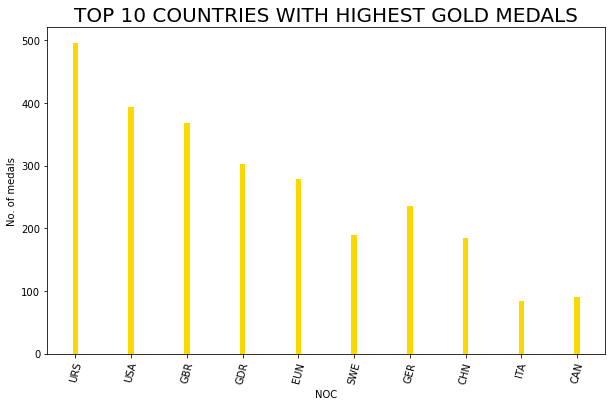

In [66]:
top_10 = Final.head(175)
plt.bar(top_10['NOC'], top_10['Total'], width=0.1, color='Gold')
plt.title('TOP 10 COUNTRIES WITH HIGHEST GOLD MEDALS', fontsize=20)
plt.xlabel('NOC')
plt.xticks(rotation=75)
plt.ylabel('No. of medals')
plt.show()

# The line plot shows the total medals gained by each country among the years,
# we can observe that URS gained the most medals in 1980

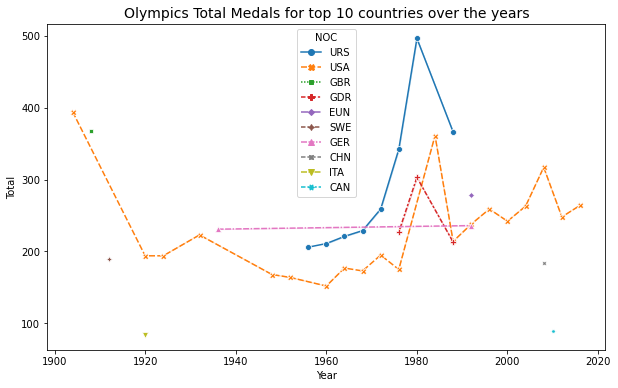

In [67]:
top_10 = Final.head(175)
sns.lineplot(x = "Year",y = "Total",data = top_10,hue = "NOC",style = "NOC",markers=True)
plt.title("Olympics Total Medals for top 10 countries over the years",fontsize = 14);


# Adding Feature one (BMI)

# We add the BMI feature for athletes Males and Females

In [68]:
athletes_df_imputed_males["BMI"] = athletes_df_imputed_males["Weight"] / athletes_df_imputed_males["Height"] / athletes_df_imputed_males["Height"] * 10000

athletes_df_imputed_males.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,BMI
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China,NaN,24.691358
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China,NaN,20.761246
2,602,Abudoureheman,M,22.0,182.0,75.0,China,CHN,2000 Summer,2000,Summer,Sydney,Boxing,Boxing Men's Middleweight,No Medal,China,NaN,22.642193
3,1463,Ai Linuer,M,25.0,160.0,62.0,China,CHN,2004 Summer,2004,Summer,Athina,Wrestling,"Wrestling Men's Lightweight, Greco-Roman",No Medal,China,NaN,24.218750
6,3605,An Weijiang,M,22.0,178.0,72.0,China,CHN,2006 Winter,2006,Winter,Torino,Speed Skating,Speed Skating Men's 500 metres,No Medal,China,NaN,22.724403


In [69]:
athletes_df_imputed_females["BMI"] = athletes_df_imputed_females["Weight"] / athletes_df_imputed_females["Height"] / athletes_df_imputed_females["Height"] * 10000

athletes_df_imputed_females.head()


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,BMI
4,1464,Ai Yanhan,F,14.0,168.0,54.0,China,CHN,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Women's 200 metres Freestyle,No Medal,China,NaN,19.132653
5,1464,Ai Yanhan,F,14.0,168.0,54.0,China,CHN,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Women's 4 x 200 metres Freestyle Relay,No Medal,China,NaN,19.132653
12,3611,An Zhongxin,F,23.0,170.0,65.0,China,CHN,1996 Summer,1996,Summer,Atlanta,Softball,Softball Women's Softball,Silver,China,NaN,22.491349
13,3611,An Zhongxin,F,27.0,170.0,65.0,China,CHN,2000 Summer,2000,Summer,Sydney,Softball,Softball Women's Softball,No Medal,China,NaN,22.491349
17,6381,Ba Yan,F,21.0,183.0,78.0,China,CHN,1984 Summer,1984,Summer,Los Angeles,Basketball,Basketball Women's Basketball,Bronze,China,NaN,23.291230


# We label the BMI ranges to Healthy/Underweight/Overweight and Obese for the Males

#  We found that there is a correlation between having better physical attributes with winning medals

In [70]:
bmi_count_df = athletes_df_imputed_males[athletes_df_imputed_males["Medal"] != "No Medal"]
bmi_group = [] # define array structure
for i in bmi_count_df["BMI"]:
    if i < 18.5:
        bmi_group.append("UnderWeight")
    elif 18.5 <= i <= 24.9:
        bmi_group.append("Healthy")
    elif 25 < i <=29.9:
        bmi_group.append("OverWeight")
    else:
        bmi_group.append("Obese")

new_bmi_df = bmi_count_df.copy()
new_bmi_df["BMI"] = bmi_group
no_group = new_bmi_df
new_bmi_df = new_bmi_df.groupby("BMI")["Medal"].count()

new_bmi_df.head()

BMI
Healthy        21829
Obese            807
OverWeight      4903
UnderWeight      201
Name: Medal, dtype: int64

# This visualization shows us that male athletes with a healthy BMI tend to get more medals compared to other athletes thus having a healthy BMI directly affects your chances of winning (Better Physical Attributes)

Text(0.5, 1.0, 'Olympics Male Medalists BMI')

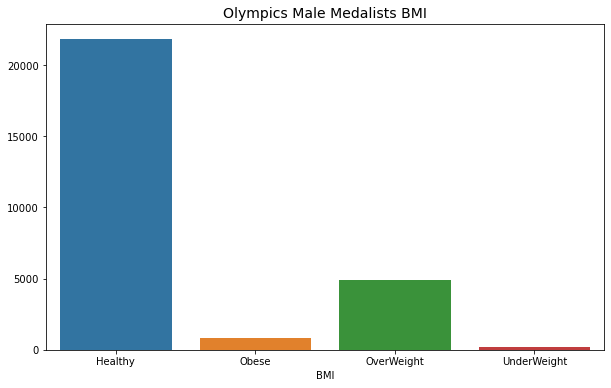

In [71]:
sns.barplot(x = new_bmi_df.index,y = new_bmi_df.values)
#sns.lineplot(x = "Year",y = "BMI",data = athletes_df_imputed_males,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Male Medalists BMI",fontsize = 14)

# We label the BMI ranges to Healthy/Underweight/Overweight and Obese for the Females

In [72]:
bmi_count_df = athletes_df_imputed_females[athletes_df_imputed_females["Medal"] != "No Medal"]
bmi_group = [] # define array structure
for i in bmi_count_df["BMI"]:
    if i < 18.5:
        bmi_group.append("UnderWeight")
    elif 18.5 <= i <= 24.9:
        bmi_group.append("Healthy")
    elif 25 < i <=29.9:
        bmi_group.append("OverWeight")
    else:
        bmi_group.append("Obese")

new_bmi_df = bmi_count_df.copy()
new_bmi_df["BMI"] = bmi_group
no_group = new_bmi_df
new_bmi_df = new_bmi_df.groupby("BMI")["Medal"].count()

new_bmi_df.head()

BMI
Healthy        9497
Obese            60
OverWeight      401
UnderWeight     661
Name: Medal, dtype: int64

# This visualization shows us that female athletes with a healthy BMI tend to get more medals compared to other athletes thus having a healthy BMI directly affects your chances of winning (Better Physical Attributes)

Text(0.5, 1.0, 'Olympics Female Medalists BMI')

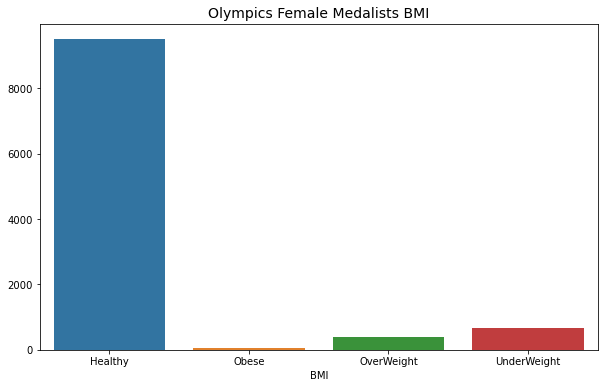

In [73]:
sns.barplot(x = new_bmi_df.index,y = new_bmi_df.values)
#sns.lineplot(x = "Year",y = "BMI",data = athletes_df_imputed_males,hue = "Medal",style = "Medal",markers=True)
plt.title("Olympics Female Medalists BMI",fontsize = 14)